# Exoplanet exploration using Machine Learning


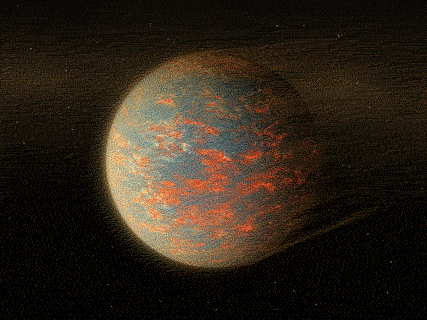

This notebook was taken from Nagesh Singh Chauhan exoplanet repo https://github.com/nageshsinghc4/Exoplanet-exploration. I have made further modifications in it.

## What are exoplanets?

Exoplanets are planets beyond our own solar system. Thousands have been discovered in the past two decades, mostly with NASA’s Kepler Space Telescope.

These exoplanets come in a huge variety of sizes and orbits. Some are gigantic planets hugging close to their parent stars; others are icy, some rocky. NASA and other agencies are looking for a special kind of planet: one that’s the same size as Earth, orbiting a sun-like star in the habitable zone.


The habitable zone is the area around a star where it is not too hot and not too cold for liquid water to exist on the surface of surrounding planets. Imagine if Earth was where Pluto is. The Sun would be barely visible (about the size of a pea) and Earth’s ocean and much of its atmosphere would freeze.

You can also check out my article to understand more about exoplanets at [www.theaidream.com](https://www.theaidream.com/post/exoplanet-exploration-using-machine-learning)

In [1]:
import os     
#it lets the user interact with the native OS Python is currently running on.
#Python os system function allows us to run a command in the Python script, just like if I was running it in my shell


for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

### Load all the required libraries

In [2]:
#pip install imblearn
# installing imblearn since the module was not present
#pip3 install upgrade scikit learn

In [2]:
import os
import warnings
import math
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
from pylab import rcParams
rcParams['figure.figsize'] = 10, 6
from sklearn.metrics import mean_squared_error, mean_absolute_error
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split 
from sklearn import linear_model
from sklearn.metrics import recall_score, precision_score, classification_report,accuracy_score,confusion_matrix, roc_curve, auc, roc_curve,accuracy_score#,plot_confusion_matrix

#function plot_confusion_matrix is depreceted in 1.0 and will be removed in 1.2. 
#Thetrefore using confusion_matrix_display instead
from sklearn.metrics import ConfusionMatrixDisplay

from sklearn.preprocessing import StandardScaler, normalize
from scipy import ndimage
import seaborn as sns


### Load the train and test data.

In [3]:
#the data sets has been downloaded from kaggle.
# https://www.kaggle.com/keplersmachines/kepler-labelled-time-series-data  

test_data = pd.read_csv('C:/Users/SREEPARNA/Downloads/exoTest.csv/exoTest.csv')
train_data = pd.read_csv('C:/Users/SREEPARNA/Downloads/exoTrain.csv/exoTrain.csv')

Trainset:

 *   5087 rows or observations.
 *   3198 columns or features.
 *  Column 1 is the label vector. Columns 2 - 3198 are the flux values over time.
 *   37 confirmed exoplanet-stars and 5050 non-exoplanet-stars.
 
Testset:

 *  570 rows or observations.
 *  3198 columns or features.
 *  Column 1 is the label vector. Columns 2 - 3198 are the flux values over time.
 *  5 confirmed exoplanet-stars and 565 non-exoplanet-stars.



In [5]:
#viewing the data set
test_data

,LABEL,FLUX.1,FLUX.2,FLUX.3,FLUX.4,FLUX.5,FLUX.6,FLUX.7,FLUX.8,FLUX.9,...,FLUX.3188,FLUX.3189,FLUX.3190,FLUX.3191,FLUX.3192,FLUX.3193,FLUX.3194,FLUX.3195,FLUX.3196,FLUX.3197
0,2,119.88,100.21,86.46,48.68,46.12,39.39,18.57,6.98,6.63,...,14.52,19.29,14.44,-1.62,13.33,45.50,31.93,35.78,269.43,57.72
1,2,5736.59,5699.98,5717.16,5692.73,5663.83,5631.16,5626.39,5569.47,5550.44,...,-581.91,-984.09,-1230.89,-1600.45,-1824.53,-2061.17,-2265.98,-2366.19,-2294.86,-2034.72
2,2,844.48,817.49,770.07,675.01,605.52,499.45,440.77,362.95,207.27,...,17.82,-51.66,-48.29,-59.99,-82.10,-174.54,-95.23,-162.68,-36.79,30.63
3,2,-826.00,-827.31,-846.12,-836.03,-745.50,-784.69,-791.22,-746.50,-709.53,...,122.34,93.03,93.03,68.81,9.81,20.75,20.25,-120.81,-257.56,-215.41
4,2,-39.57,-15.88,-9.16,-6.37,-16.13,-24.05,-0.90,-45.20,-5.04,...,-37.87,-61.85,-27.15,-21.18,-33.76,-85.34,-81.46,-61.98,-69.34,-17.84
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
565,1,374.46,326.06,319.87,338.23,251.54,209.84,186.35,167.46,135.45,...,-123.55,-166.90,-222.44,-209.71,-180.16,-166.83,-235.66,-213.63,-205.99,-194.07
566,1,-0.36,4.96,6.25,4.20,8.26,-9.53,-10.10,-4.54,-11.55,...,-12.40,-5.99,-17.94,-11.96,-12.11,-13.68,-3.59,-5.32,-10.98,-11.24
567,1,-54.01,-44.13,-41.23,-42.82,-39.47,-24.88,-31.14,-24.71,-13.12,...,-0.73,-1.64,1.58,-4.82,-11.93,-17.14,-4.25,5.47,14.46,18.70
568,1,91.36,85.60,48.81,48.69,70.05,22.30,11.63,37.86,28.27,...,2.44,11.53,-16.42,-17.86,21.10,-10.25,-37.06,-8.43,-6.48,17.60


In [6]:
train_data

,LABEL,FLUX.1,FLUX.2,FLUX.3,FLUX.4,FLUX.5,FLUX.6,FLUX.7,FLUX.8,FLUX.9,...,FLUX.3188,FLUX.3189,FLUX.3190,FLUX.3191,FLUX.3192,FLUX.3193,FLUX.3194,FLUX.3195,FLUX.3196,FLUX.3197
0,2,93.85,83.81,20.10,-26.98,-39.56,-124.71,-135.18,-96.27,-79.89,...,-78.07,-102.15,-102.15,25.13,48.57,92.54,39.32,61.42,5.08,-39.54
1,2,-38.88,-33.83,-58.54,-40.09,-79.31,-72.81,-86.55,-85.33,-83.97,...,-3.28,-32.21,-32.21,-24.89,-4.86,0.76,-11.70,6.46,16.00,19.93
2,2,532.64,535.92,513.73,496.92,456.45,466.00,464.50,486.39,436.56,...,-71.69,13.31,13.31,-29.89,-20.88,5.06,-11.80,-28.91,-70.02,-96.67
3,2,326.52,347.39,302.35,298.13,317.74,312.70,322.33,311.31,312.42,...,5.71,-3.73,-3.73,30.05,20.03,-12.67,-8.77,-17.31,-17.35,13.98
4,2,-1107.21,-1112.59,-1118.95,-1095.10,-1057.55,-1034.48,-998.34,-1022.71,-989.57,...,-594.37,-401.66,-401.66,-357.24,-443.76,-438.54,-399.71,-384.65,-411.79,-510.54
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5082,1,-91.91,-92.97,-78.76,-97.33,-68.00,-68.24,-75.48,-49.25,-30.92,...,139.95,147.26,156.95,155.64,156.36,151.75,-24.45,-17.00,3.23,19.28
5083,1,989.75,891.01,908.53,851.83,755.11,615.78,595.77,458.87,492.84,...,-26.50,-4.84,-76.30,-37.84,-153.83,-136.16,38.03,100.28,-45.64,35.58
5084,1,273.39,278.00,261.73,236.99,280.73,264.90,252.92,254.88,237.60,...,-26.82,-53.89,-48.71,30.99,15.96,-3.47,65.73,88.42,79.07,79.43
5085,1,3.82,2.09,-3.29,-2.88,1.66,-0.75,3.85,-0.03,3.28,...,10.86,-3.23,-5.10,-4.61,-9.82,-1.50,-4.65,-14.55,-6.41,-2.55


The data describe the change in flux (light intensity) over time of several thousand stars (5087). Each star has a binary label of 2 or 1. 2 indicated that that the star is confirmed to have at least one exoplanet in orbit; some observations are in fact multi-planet systems.

As you can imagine, planets themselves do not emit light, but the stars that they orbit do. If said star is watched over several months or years, there may be a regular 'dimming' of the flux (the light intensity). This is evidence that there may be an orbiting body around the star; such a star could be considered to be a 'candidate' system. Further study of our candidate system, for example by a satellite that captures light at a different wavelength, could solidify the belief that the candidate can in fact be 'confirmed'.

Now the target column LABEL consists of two categories 1(Does not represents exoplanet) and 2(represents the presence of exoplanet). So, convert them to binary values for easier processing of data.

In [4]:
categ = {2: 1,1: 0}      
train_data.LABEL = [categ[item] for item in train_data.LABEL]
test_data.LABEL = [categ[item] for item in test_data.LABEL]

#label column contains value either 1 or 2 in both the data sets. 
#here we are changing 1 to 0 and 2 to 1 for easier understanding.

In [8]:
train_data.describe()

#This method generates descriptive statistics of a pandas DataFrame. 
# it provides statistical information on the numerical columns of the DataFrame.

,LABEL,FLUX.1,FLUX.2,FLUX.3,FLUX.4,FLUX.5,FLUX.6,FLUX.7,FLUX.8,FLUX.9,...,FLUX.3188,FLUX.3189,FLUX.3190,FLUX.3191,FLUX.3192,FLUX.3193,FLUX.3194,FLUX.3195,FLUX.3196,FLUX.3197
count,5087.000000,5.087000e+03,5.087000e+03,5.087000e+03,5.087000e+03,5.087000e+03,5.087000e+03,5.087000e+03,5.087000e+03,5.087000e+03,...,5.087000e+03,5.087000e+03,5.087000e+03,5.087000e+03,5.087000e+03,5.087000e+03,5087.000000,5087.000000,5087.000000,5087.000000
mean,0.007273,1.445054e+02,1.285778e+02,1.471348e+02,1.561512e+02,1.561477e+02,1.469646e+02,1.168380e+02,1.144983e+02,1.228639e+02,...,3.485578e+02,4.956476e+02,6.711211e+02,7.468790e+02,6.937372e+02,6.553031e+02,-494.784966,-544.594264,-440.239100,-300.536399
std,0.084982,2.150669e+04,2.179717e+04,2.191309e+04,2.223366e+04,2.308448e+04,2.410567e+04,2.414109e+04,2.290691e+04,2.102681e+04,...,2.864786e+04,3.551876e+04,4.349963e+04,4.981375e+04,5.087103e+04,5.339979e+04,17844.469520,17722.339334,16273.406292,14459.795577
min,0.000000,-2.278563e+05,-3.154408e+05,-2.840018e+05,-2.340069e+05,-4.231956e+05,-5.975521e+05,-6.724046e+05,-5.790136e+05,-3.973882e+05,...,-3.240480e+05,-3.045540e+05,-2.933140e+05,-2.838420e+05,-3.288214e+05,-5.028894e+05,-775322.000000,-732006.000000,-700992.000000,-643170.000000
25%,0.000000,-4.234000e+01,-3.952000e+01,-3.850500e+01,-3.505000e+01,-3.195500e+01,-3.338000e+01,-2.813000e+01,-2.784000e+01,-2.683500e+01,...,-1.760000e+01,-1.948500e+01,-1.757000e+01,-2.076000e+01,-2.226000e+01,-2.440500e+01,-26.760000,-24.065000,-21.135000,-19.820000
50%,0.000000,-7.100000e-01,-8.900000e-01,-7.400000e-01,-4.000000e-01,-6.100000e-01,-1.030000e+00,-8.700000e-01,-6.600000e-01,-5.600000e-01,...,2.600000e+00,2.680000e+00,3.050000e+00,3.590000e+00,3.230000e+00,3.500000e+00,-0.680000,0.360000,0.900000,1.430000
75%,0.000000,4.825500e+01,4.428500e+01,4.232500e+01,3.976500e+01,3.975000e+01,3.514000e+01,3.406000e+01,3.170000e+01,3.045500e+01,...,2.211000e+01,2.235000e+01,2.639500e+01,2.909000e+01,2.780000e+01,3.085500e+01,18.175000,18.770000,19.465000,20.280000
max,1.000000,1.439240e+06,1.453319e+06,1.468429e+06,1.495750e+06,1.510937e+06,1.508152e+06,1.465743e+06,1.416827e+06,1.342888e+06,...,1.779338e+06,2.379227e+06,2.992070e+06,3.434973e+06,3.481220e+06,3.616292e+06,288607.500000,215972.000000,207590.000000,211302.000000


Now visualize the target column in the train_dataset and get an idea about the class distribution.

In [9]:
train_data['LABEL'].value_counts()

# here the command counts no of elements with value 0 and 1 each in the column LABEL

0    5050
1      37
Name: LABEL, dtype: int64

We have 5050 records of non-exoplanets and 37 records of exoplanets.

In [10]:
test_data['LABEL'].value_counts()

0    565
1      5
Name: LABEL, dtype: int64

We have 565 records of non-exoplanets and 5 records of exoplanets.

Text(0.5, 1.0, 'Class Distributions \n (0: Not Exoplanet || 1: Exoplanet)')

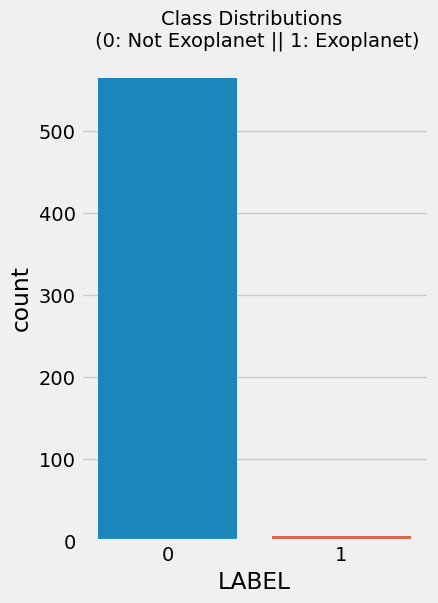

In [11]:
# plotting with test data
plt.figure(figsize=(4,6))
colors = ["0", "1"]
sns.countplot('LABEL', data=test_data)#, palette = "Set2")
plt.title('Class Distributions \n (0: Not Exoplanet || 1: Exoplanet)', fontsize=14)

Text(0.5, 1.0, 'Class Distributions \n (0: Not Exoplanet || 1: Exoplanet)')

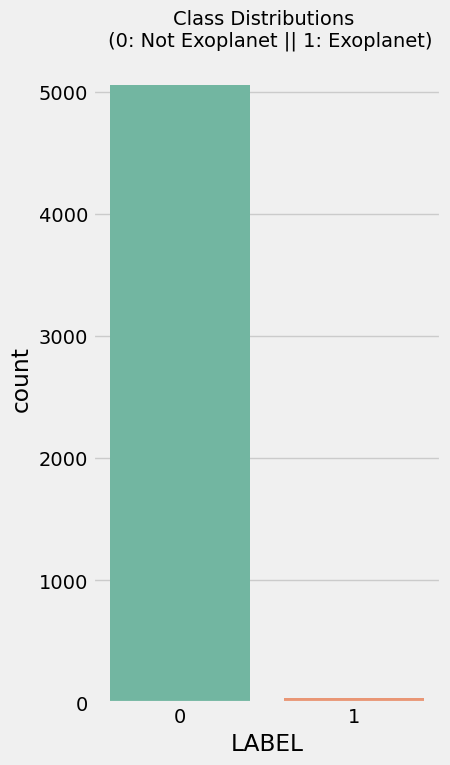

In [12]:
# plotting with train data set
plt.figure(figsize=(4,8))
colors = ["0", "1"]
sns.countplot('LABEL', data=train_data, palette = "Set2")
plt.title('Class Distributions \n (0: Not Exoplanet || 1: Exoplanet)', fontsize=14)

In [13]:
#label = train_data['LABEL']
#sns.histplot(label)

It turns out that the data is highly imbalanced so later on we'll be using some sampling techniques to balance the data.

### Plotting heatmap of missing values

A heatmap is a graphical representation of data in a tabular format where the individual values are represented as colors. 

Heatmaps are useful for visually identifying patterns and trends in large datasets, particularly for identifying correlations between variables. They are particularly useful for data exploration and analysis, allowing us to easily identify clusters of high or low values, and the relationships between different variables.

In a heatmap, each cell in a tabular dataset is assigned a color based on its value. The color scale is usually chosen to represent the range of values in the dataset, with a gradient of colors representing the values from low to high. For example, darker colors might represent higher values, while lighter colors might represent lower values.



<AxesSubplot:>

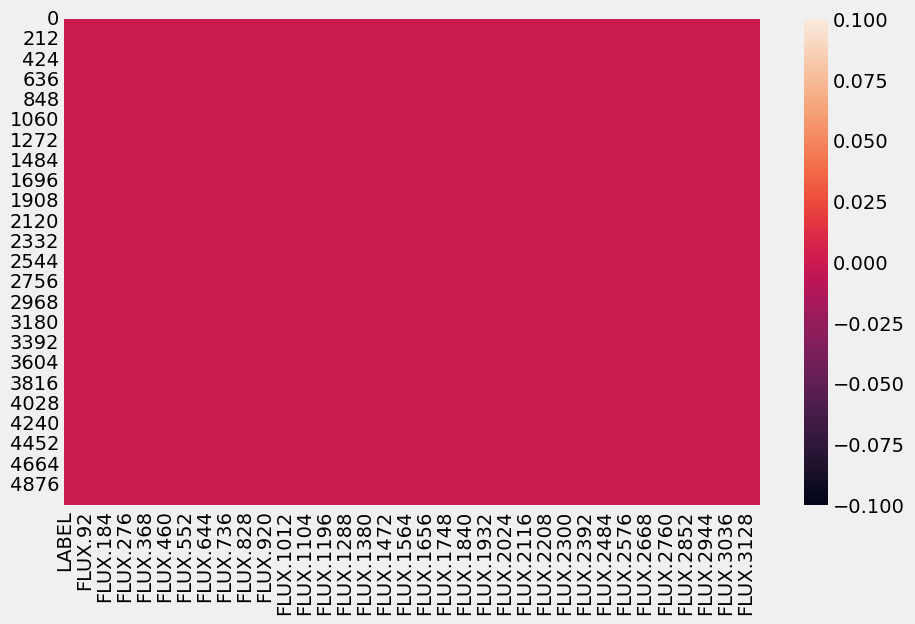

In [14]:
sns.heatmap(train_data.isnull())

We can clearly see that we dont have any missing values in our dataset.

**Flux :** the intensity of light recived from a planet

The "isnull()" function is applied to the "train_data" dataset, which returns a new dataset with the same shape as "train_data" but with Boolean values (True/False) indicating whether each element of the dataset is missing (i.e., null or NaN).

The resulting dataset of Boolean values is then passed as input to the "sns.heatmap()" function of the Seaborn library, which creates a heatmap where each square represents a cell in the dataset and the color of the square indicates the presence or absence of a null value in that cell.

### Let us plot the first 4 rows of the train data and observe the intensity of flux values.

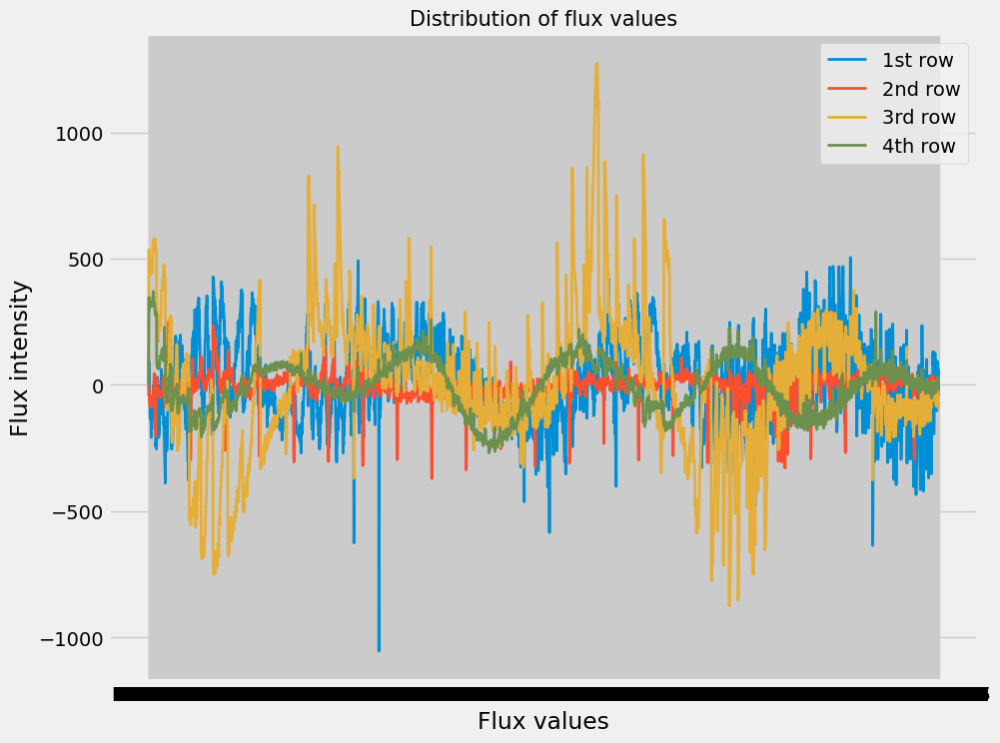

In [15]:
plt.figure(figsize=(10,8))
plt.title('Distribution of flux values', fontsize=15)
plt.xlabel('Flux values')
plt.ylabel('Flux intensity')
plt.plot(train_data.iloc[0,], linewidth=2, label = '1st row')    # plot function is used here to create a line plot of the first row of the dataset
plt.plot(train_data.iloc[1,], linewidth=2, label = '2nd row')    # The "iloc" function is used to extract a specific row from the dataset
plt.plot(train_data.iloc[2,], linewidth=2, label = '3rd row')
plt.plot(train_data.iloc[3,], linewidth=2, label = '4th row')
plt.legend()
plt.show()

### Plotting the correlation matrix

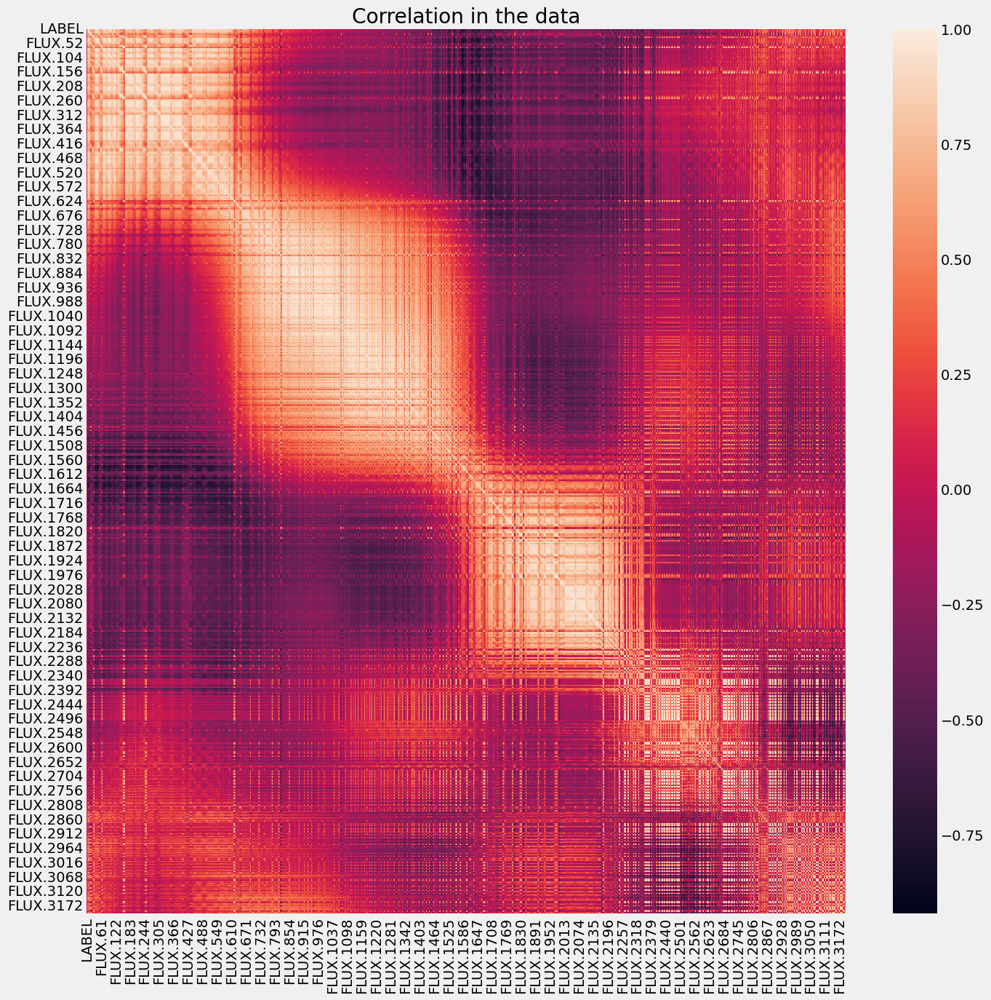

In [16]:
plt.figure(figsize=(15,15))
sns.heatmap(train_data.corr())
plt.title('Correlation in the data')
plt.show()

#here we r creating heatmap of the correlation matrix of the dataset
#The "corr()" func returns a new dataset with the same shape as "train_data" 
#but with the Pearson correlation coefficients between all pairs of columns. 
#The Pearson correlation coefficient takes values ranging from
#-1 (perfect negative correlation) to 1 (perfect positive correlation).


### plot the Gaussian histogram of non-exoplanets data.

In [17]:
# extracting the values of data which are non exoplanet
# creating a boolean mask based on the condition lABEL = 0
mask = train_data['LABEL'] == 0

# use the mask to extract the desired data
desired_data = train_data[mask]
desired_data

,LABEL,FLUX.1,FLUX.2,FLUX.3,FLUX.4,FLUX.5,FLUX.6,FLUX.7,FLUX.8,FLUX.9,...,FLUX.3188,FLUX.3189,FLUX.3190,FLUX.3191,FLUX.3192,FLUX.3193,FLUX.3194,FLUX.3195,FLUX.3196,FLUX.3197
37,0,-141.22,-81.79,-52.28,-32.45,-1.55,-35.61,-23.28,19.45,53.11,...,-50.79,-22.34,-36.23,27.44,13.52,38.66,-17.53,31.49,31.38,50.03
38,0,-35.62,-28.55,-27.29,-28.94,-15.13,-51.06,2.67,-5.21,9.67,...,-43.98,-38.22,-46.23,-54.40,-23.51,-26.96,-3.95,-0.34,10.52,-7.69
39,0,142.40,137.03,93.65,105.64,98.22,99.06,86.40,60.78,45.18,...,-0.99,-3.03,-30.27,-24.22,-35.10,-39.64,23.78,23.40,-0.50,0.97
40,0,-167.02,-137.65,-150.05,-136.85,-98.73,-103.14,-107.70,-123.19,-125.65,...,-97.43,-79.79,-80.62,-78.22,-105.06,-69.67,-90.45,-73.67,-66.71,-66.07
41,0,207.74,223.60,246.15,224.06,210.77,189.56,172.68,170.31,148.79,...,-53.06,-136.92,-174.97,-180.46,-164.01,-126.58,84.05,63.81,108.36,78.10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5082,0,-91.91,-92.97,-78.76,-97.33,-68.00,-68.24,-75.48,-49.25,-30.92,...,139.95,147.26,156.95,155.64,156.36,151.75,-24.45,-17.00,3.23,19.28
5083,0,989.75,891.01,908.53,851.83,755.11,615.78,595.77,458.87,492.84,...,-26.50,-4.84,-76.30,-37.84,-153.83,-136.16,38.03,100.28,-45.64,35.58
5084,0,273.39,278.00,261.73,236.99,280.73,264.90,252.92,254.88,237.60,...,-26.82,-53.89,-48.71,30.99,15.96,-3.47,65.73,88.42,79.07,79.43
5085,0,3.82,2.09,-3.29,-2.88,1.66,-0.75,3.85,-0.03,3.28,...,10.86,-3.23,-5.10,-4.61,-9.82,-1.50,-4.65,-14.55,-6.41,-2.55


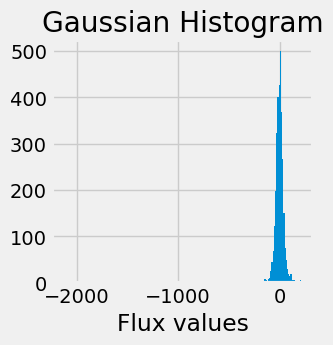

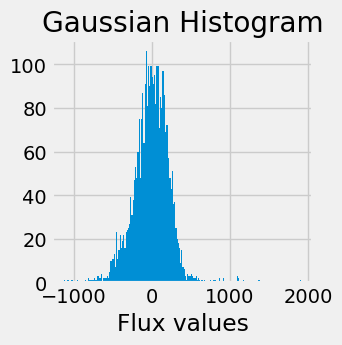

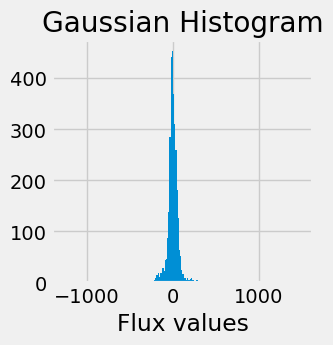

In [18]:
labels_1=[100,200,300]     # these values here are values of row no. which has a non-exoplanet selected by looking at the dataset
for i in labels_1:
    plt.figure(figsize=(3,3))
    plt.hist(train_data.iloc[i,:], bins=200)
    plt.title("Gaussian Histogram")
    plt.xlabel("Flux values")
    plt.show()
    
# a series of histograms are created here depending on the no of rows (i)
# more rows can also be selected by adding the row no in the labels_1 list

### plot Gaussian histogram of the data when exoplanets are present.

In [19]:
# extracting the values of data which are exoplanet
# creating a boolean mask based on the condition lABEL = 1
mask = train_data['LABEL'] == 1

# use the mask to extract the desired data
desired_data = train_data[mask]
desired_data

,LABEL,FLUX.1,FLUX.2,FLUX.3,FLUX.4,FLUX.5,FLUX.6,FLUX.7,FLUX.8,FLUX.9,...,FLUX.3188,FLUX.3189,FLUX.3190,FLUX.3191,FLUX.3192,FLUX.3193,FLUX.3194,FLUX.3195,FLUX.3196,FLUX.3197
0,1,93.85,83.81,20.10,-26.98,-39.56,-124.71,-135.18,-96.27,-79.89,...,-78.07,-102.15,-102.15,25.13,48.57,92.54,39.32,61.42,5.08,-39.54
1,1,-38.88,-33.83,-58.54,-40.09,-79.31,-72.81,-86.55,-85.33,-83.97,...,-3.28,-32.21,-32.21,-24.89,-4.86,0.76,-11.70,6.46,16.00,19.93
2,1,532.64,535.92,513.73,496.92,456.45,466.00,464.50,486.39,436.56,...,-71.69,13.31,13.31,-29.89,-20.88,5.06,-11.80,-28.91,-70.02,-96.67
3,1,326.52,347.39,302.35,298.13,317.74,312.70,322.33,311.31,312.42,...,5.71,-3.73,-3.73,30.05,20.03,-12.67,-8.77,-17.31,-17.35,13.98
4,1,-1107.21,-1112.59,-1118.95,-1095.10,-1057.55,-1034.48,-998.34,-1022.71,-989.57,...,-594.37,-401.66,-401.66,-357.24,-443.76,-438.54,-399.71,-384.65,-411.79,-510.54
5,1,211.10,163.57,179.16,187.82,188.46,168.13,203.46,178.65,166.49,...,-98.45,30.34,30.34,29.62,28.80,19.27,-43.90,-41.63,-52.90,-16.16
6,1,9.34,49.96,33.30,9.63,37.64,20.85,4.54,22.42,10.11,...,-58.56,9.93,9.93,23.50,5.28,-0.44,10.90,-11.77,-9.25,-36.69
7,1,238.77,262.16,277.80,190.16,180.98,123.27,103.95,50.70,59.91,...,-72.48,31.77,31.77,53.48,27.88,95.30,48.86,-10.62,-112.02,-229.92
8,1,-103.54,-118.97,-108.93,-72.25,-61.46,-50.16,-20.61,-12.44,1.48,...,43.92,7.24,7.24,-7.45,-18.82,4.53,21.95,26.94,34.08,44.65
9,1,-265.91,-318.59,-335.66,-450.47,-453.09,-561.47,-606.03,-712.72,-685.97,...,3671.03,2249.28,2249.28,2437.78,2584.22,3162.53,3398.28,3648.34,3671.97,3781.91


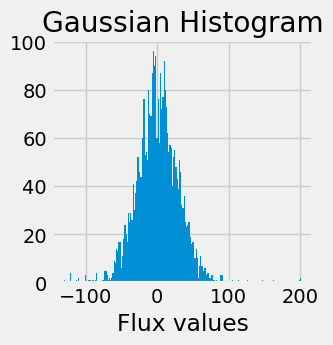

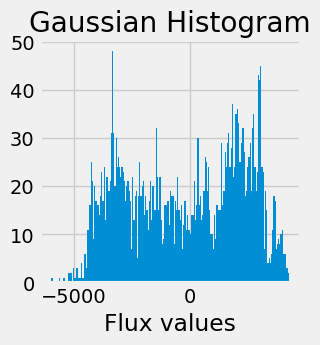

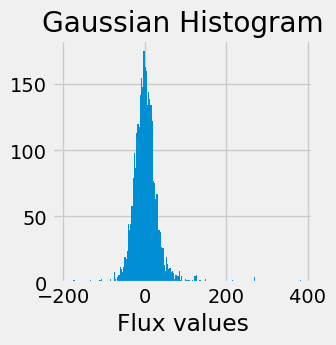

In [20]:
#from the above table we select 3 random rows

labels_1=[16,21,25]
for i in labels_1:
    plt.figure(figsize=(3,3))
    plt.hist(train_data.iloc[i,:], bins=200)
    plt.title("Gaussian Histogram")
    plt.xlabel("Flux values")
    plt.show()

### Detecting outliers using Boxplot

Box Plot is the visual representation of the depicting groups of numerical data through their quartiles. Boxplot is also used for detect the outlier in data set. It captures the summary of the data efficiently with a simple box and whiskers and allows us to compare easily across groups. Boxplot summarizes a sample data using 25th, 50th and 75th percentiles. 

<AxesSubplot:xlabel='LABEL', ylabel='FLUX.5'>

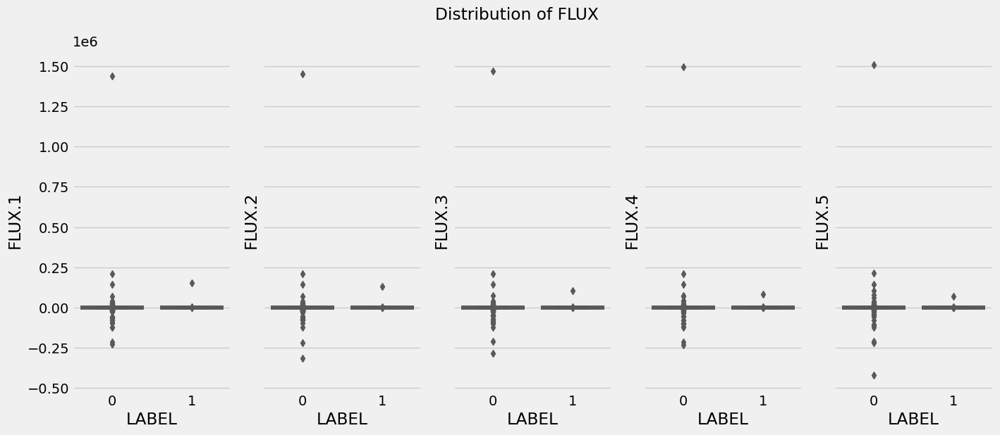

In [21]:
fig, axes = plt.subplots(1, 5,figsize=(15, 6), sharey=True)
#sharey=True ensures that all subplots share the same y-axis scale 

fig.suptitle('Distribution of FLUX')

sns.boxplot(ax=axes[0], data=train_data, x='LABEL', y='FLUX.1',palette="Set2")
sns.boxplot(ax=axes[1], data=train_data, x='LABEL', y='FLUX.2',palette="Set2")
sns.boxplot(ax=axes[2], data=train_data, x='LABEL', y='FLUX.3',palette="Set2")
sns.boxplot(ax=axes[3], data=train_data, x='LABEL', y='FLUX.4',palette="Set2")
sns.boxplot(ax=axes[4], data=train_data, x='LABEL', y='FLUX.5',palette="Set2")
#'ax' parameter specifies which subplot the boxplot will be drawn on

In [5]:
print('Dropping Outliers')
train_data.drop(train_data[train_data['FLUX.1']>250000].index, axis=0, inplace=True)

#droping rows from the dataframe where the value in the column FLUX.1 is greater than 250000 by creating a boolean mask.
# .index selects index of the rows satisfying the condition.
#axis=0 specifies that the rows with the selected index should be dropped.
#inplace=True specifies that the dataframe should be modified in place rather than creating a new modified dataframe.
#even though we r testing for FLUX.1, it removes values for all the fluxes above 250000.

Dropping Outliers


In [6]:
train_data.describe()
#we see only one row has been dropped

,LABEL,FLUX.1,FLUX.2,FLUX.3,FLUX.4,FLUX.5,FLUX.6,FLUX.7,FLUX.8,FLUX.9,...,FLUX.3188,FLUX.3189,FLUX.3190,FLUX.3191,FLUX.3192,FLUX.3193,FLUX.3194,FLUX.3195,FLUX.3196,FLUX.3197
count,5086.000000,5086.000000,5086.000000,5086.000000,5086.000000,5086.000000,5086.000000,5086.000000,5086.000000,5086.000000,...,5.086000e+03,5.086000e+03,5.086000e+03,5.086000e+03,5.086000e+03,5.086000e+03,5086.000000,5086.000000,5086.000000,5086.000000
mean,0.007275,-138.446972,-157.145804,-141.556101,-137.909719,-140.899290,-149.536730,-171.330714,-164.053110,-141.148238,...,2.563840e+02,3.944869e+02,5.605028e+02,6.315978e+02,5.780501e+02,5.406935e+02,-551.627727,-587.165360,-478.310519,-337.013401
std,0.084990,7434.560053,7735.359559,7498.781044,7379.984086,9167.805819,11571.345173,12664.634175,11403.820771,9357.769487,...,2.788608e+04,3.478164e+04,4.278237e+04,4.913532e+04,5.020235e+04,5.277561e+04,17379.524654,17462.018889,16046.841315,14225.219040
min,0.000000,-227856.260000,-315440.760000,-284001.760000,-234006.870000,-423195.620000,-597552.120000,-672404.560000,-579013.560000,-397388.240000,...,-3.240480e+05,-3.045540e+05,-2.933140e+05,-2.838420e+05,-3.288214e+05,-5.028894e+05,-775322.000000,-732006.000000,-700992.000000,-643170.000000
25%,0.000000,-42.355000,-39.545000,-38.517500,-35.085000,-31.967500,-33.420000,-28.135000,-27.890000,-26.847500,...,-1.761000e+01,-1.948750e+01,-1.757500e+01,-2.076000e+01,-2.227000e+01,-2.444250e+01,-26.760000,-24.067500,-21.137500,-19.825000
50%,0.000000,-0.710000,-0.900000,-0.750000,-0.400000,-0.645000,-1.030000,-0.875000,-0.660000,-0.565000,...,2.600000e+00,2.675000e+00,3.045000e+00,3.585000e+00,3.220000e+00,3.495000e+00,-0.685000,0.355000,0.900000,1.430000
75%,0.000000,48.237500,44.177500,42.262500,39.670000,39.700000,35.075000,33.912500,31.655000,30.407500,...,2.206750e+01,2.232750e+01,2.637000e+01,2.906750e+01,2.778750e+01,3.084500e+01,18.125000,18.757500,19.437500,20.255000
max,1.000000,211468.500000,211267.250000,210920.250000,211229.750000,211945.000000,212491.000000,212028.250000,212102.750000,211919.750000,...,1.779338e+06,2.379227e+06,2.992070e+06,3.434973e+06,3.481220e+06,3.616292e+06,201974.000000,204761.000000,207590.000000,211302.000000


### Split the dataset

So let us first split our dataset and normalize it.

In [7]:
x_train = train_data.drop(["LABEL"],axis=1)
y_train = train_data["LABEL"]   
x_test = test_data.drop(["LABEL"],axis=1)
y_test = test_data["LABEL"]

#droping a column from the dataframes and storing then in another variable

### Data Normalization

**Data Normalization** is a technique often applied as part of data preparation for machine learning. The goal of normalization is to change the values of numeric columns in the dataset to a common scale, without distorting differences in the ranges of values.

In [8]:
x_train = normalized = normalize(x_train)
x_test = normalize(x_test)

### Apply gaussian filters

The next step is to apply gaussian filters to both test and train.


In probability theory, the normal (or Gaussian or Gauss or Laplace–Gauss) distribution is a very common continuous probability distribution. Normal distributions are important in statistics and are often used in the natural and social sciences to represent real-valued random variables whose distributions are not known.

In [9]:
x_train = filtered = ndimage.filters.gaussian_filter(x_train, sigma=10)
#The filtered array is assigned to a new variable called "filtered" and also assigned to "x_train".

x_test = ndimage.filters.gaussian_filter(x_test, sigma=10)
# by applying the gaussian filter we smoothen the datas

By applying the Gaussian filter to the input features, the code is likely attempting to reduce the impact of noisy or irrelevant features on the model's predictions, which can improve the model's accuracy and generalization performance.

### Feature scaling

we use feature scaling so that all the values remain in the comparable range.

In [10]:
#Feature scaling
std_scaler = StandardScaler()
x_train = scaled = std_scaler.fit_transform(x_train)
x_test = std_scaler.fit_transform(x_test)

### Model Building

A **confusion matrix** is a table that is commonly used to evaluate the performance of a classification model in machine learning. The matrix shows the number of correct and incorrect predictions made by the model for each class, compared to the actual class labels.

A confusion matrix typically has four values:

    True Positive (TP): the number of instances that are actually positive and the model correctly predicts as positive.
    False Positive (FP): the number of instances that are actually negative but the model incorrectly predicts as positive.
    True Negative (TN): the number of instances that are actually negative and the model correctly predicts as negative.
    False Negative (FN): the number of instances that are actually positive but the model incorrectly predicts as negative.

These values are often presented in a matrix format with the actual class labels represented in rows and the predicted class labels represented in columns.

A confusion matrix can provide insights into the strengths and weaknesses of a classification model, such as identifying which classes are most frequently misclassified. It can also be used to calculate various evaluation metrics for the model, such as precision, recall, F1-score, and accuracy.

### K-NN model
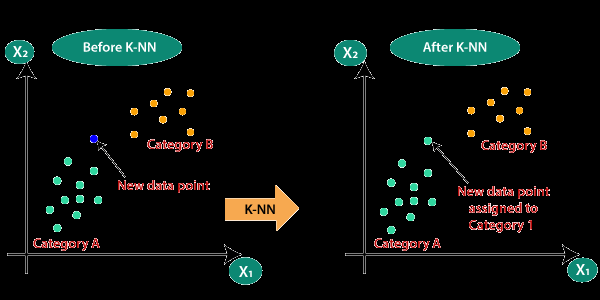
credits:https://www.google.com/url?sa=i&url=https%3A%2F%2Fwww.javatpoint.com%2Fk-nearest-neighbor-algorithm-for-machine-learning&psig=AOvVaw3LZldgWo3_aSJ-w1oczs-5&ust=1684182835273000&source=images&cd=vfe&ved=0CBEQjRxqFwoTCND6647U9f4CFQAAAAAdAAAAABAE

Validation accuracy of KNN is 0.9912280701754386

Classification report :
               precision    recall  f1-score   support

           0       0.99      1.00      1.00       565
           1       0.00      0.00      0.00         5

    accuracy                           0.99       570
   macro avg       0.50      0.50      0.50       570
weighted avg       0.98      0.99      0.99       570



Text(0.5, 1.0, 'ROC - CURVE & AREA UNDER CURVE')

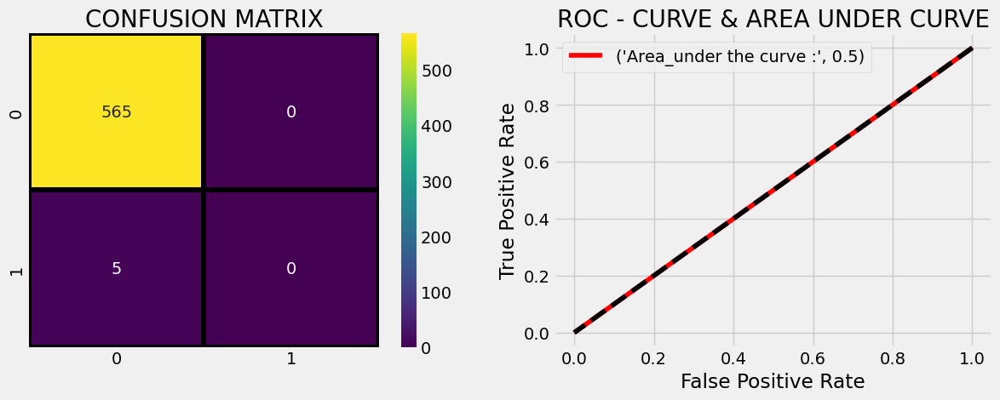

In [11]:
#K-NN
#K Nearest neighbour
#the input data points are classified based on the class of their neighboring data points.
#the KNN model is fitted to the train data set which is then used to make predictions on the test data set


from sklearn.neighbors import KNeighborsClassifier
knn_model = KNeighborsClassifier()

knn_model.fit(x_train,y_train)
prediction=knn_model.predict(x_test)
print('Validation accuracy of KNN is', accuracy_score(prediction,y_test))
print ("\nClassification report :\n",(classification_report(y_test,prediction)))

#Confusion matrix
plt.figure(figsize=(13,10))
plt.subplot(221)      #creates a 2x2 grid of subplots and selects the first subplot (top left).
sns.heatmap(confusion_matrix(y_test,prediction),annot=True,cmap="viridis",fmt = "d",linecolor="k",linewidths=3)
# (y_test) are the true labels and (prediction) are the predicted labels
#fmt = "d" formats the values as integers
#annot=True parameter adds the numerical values to each cell
plt.title("CONFUSION MATRIX",fontsize=20)

#ROC curve and Area under the curve plotting
#ROC - Receiver Operating Characteristic
#graphical representation of performance of a binary classification model.
#True Positive Rate (TPR)-ratio of true positives to total number of actual positives 
#False Positive Rate (FPR)-ratio of false positives to the total number of actual negatives.
#auc-area under curve
predicting_probabilites = knn_model.predict_proba(x_test)[:,1]
fpr,tpr,thresholds = roc_curve(y_test,predicting_probabilites) 
plt.subplot(222)
plt.plot(fpr,tpr,label = ("Area_under the curve :",auc(fpr,tpr)),color = "r") 
#plots the ROC curve by connecting the FPR and TPR values at different threshold values
plt.plot([1,0],[1,0],linestyle = "dashed",color ="k")
#plots the diagonal line from the bottom left to the top right representing ROC curve of a random classifier.
plt.legend(loc = "best")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("ROC - CURVE & AREA UNDER CURVE",fontsize=20)

This classifier is not that good as we can see from the ROC curve which is almost same as any random classifier with area under the curve as 0.5.

### Logistic regression model
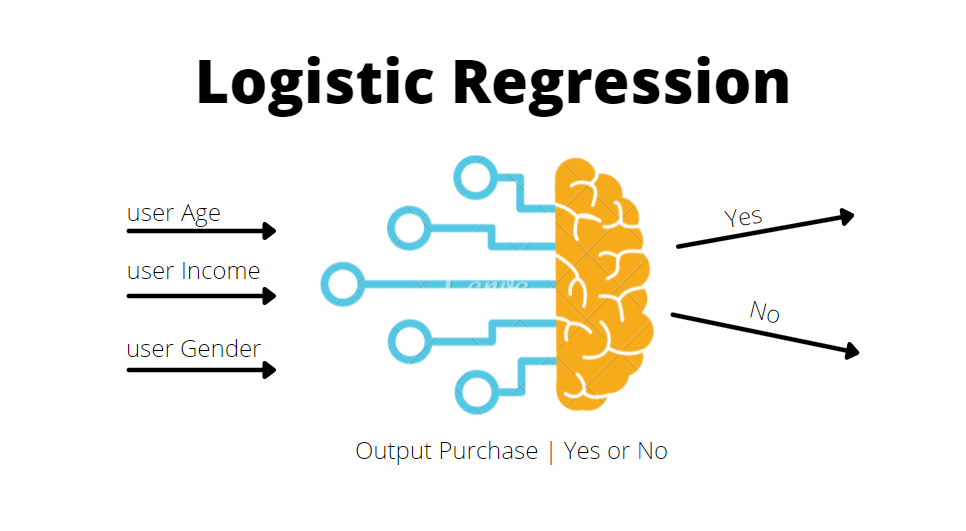
credits: https://www.google.com/url?sa=i&url=https%3A%2F%2Fblog.devgenius.io%2Fdevelop-a-logistic-regression-machine-learning-model-64d2be403ba3&psig=AOvVaw0rm1QsOQF7ws7-D_hT7Mf_&ust=1684183313320000&source=images&cd=vfe&ved=0CBEQjRxqFwoTCLDL3_LV9f4CFQAAAAAdAAAAABAZ

Validation accuracy of Logistic Regression is 0.9842105263157894

Classification report :
               precision    recall  f1-score   support

           0       0.99      0.99      0.99       565
           1       0.00      0.00      0.00         5

    accuracy                           0.98       570
   macro avg       0.50      0.50      0.50       570
weighted avg       0.98      0.98      0.98       570



Text(0.5, 1.0, 'ROC - CURVE & AREA UNDER CURVE')

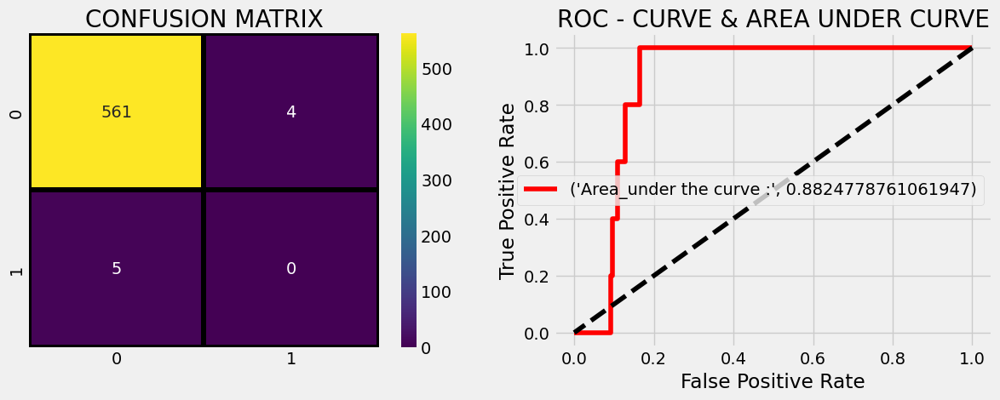

In [12]:
#Logistic Regression
# used to analyze the relationship between a binary dependent variable and one or more independent variables. 
#predicts probability of dependent variable taking a particular value based on the values of the independent variables.
#The formula for the logistic function is: p(y=1|x) = 1 / (1 + exp(-z))
from sklearn.linear_model import LogisticRegression
lr_model = LogisticRegression(class_weight={0:100, 1:1})

lr_model.fit(x_train,y_train)

prediction=lr_model.predict(x_test)

print('Validation accuracy of Logistic Regression is', accuracy_score(prediction,y_test))
print ("\nClassification report :\n",(classification_report(y_test,prediction)))

#Confusion matrix
plt.figure(figsize=(13,10))
plt.subplot(221)
sns.heatmap(confusion_matrix(y_test,prediction),annot=True,cmap="viridis",fmt = "d",linecolor="k",linewidths=3)
plt.title("CONFUSION MATRIX",fontsize=20)

#ROC curve and Area under the curve plotting
predicting_probabilites = lr_model.predict_proba(x_test)[:,1]
fpr,tpr,thresholds = roc_curve(y_test,predicting_probabilites)
plt.subplot(222)
plt.plot(fpr,tpr,label = ("Area_under the curve :",auc(fpr,tpr)),color = "r")
plt.plot([1,0],[1,0],linestyle = "dashed",color ="k")
plt.legend(loc = "best")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("ROC - CURVE & AREA UNDER CURVE",fontsize=20)

This classifier is better than K-NN as we can see from the ROC curve with area under the curve as 0.87.

### Decision tree model
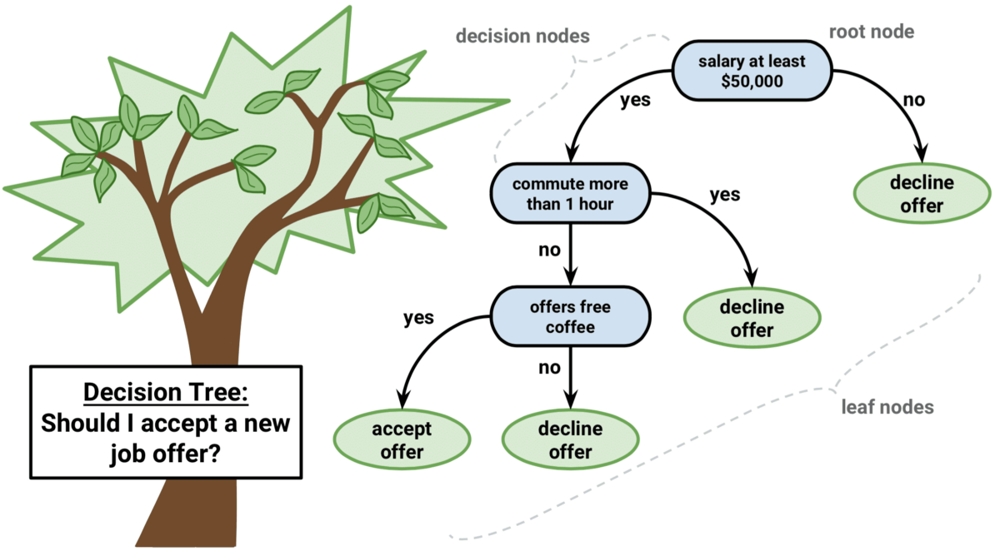
credits: https://www.google.com/url?sa=i&url=https%3A%2F%2Fregenerativetoday.com%2Fsimple-explanation-on-how-decision-tree-algorithm-makes-decisions%2F&psig=AOvVaw2A9VPM5PlSXyfY21paQom6&ust=1684183029794000&source=images&cd=vfe&ved=0CBEQjRxqFwoTCLiIzevU9f4CFQAAAAAdAAAAABAp

Validation accuracy of Decision Tree is 0.9614035087719298

Classification report :
               precision    recall  f1-score   support

           0       0.99      0.97      0.98       565
           1       0.00      0.00      0.00         5

    accuracy                           0.96       570
   macro avg       0.50      0.48      0.49       570
weighted avg       0.98      0.96      0.97       570



Text(0.5, 1.0, 'ROC - CURVE & AREA UNDER CURVE')

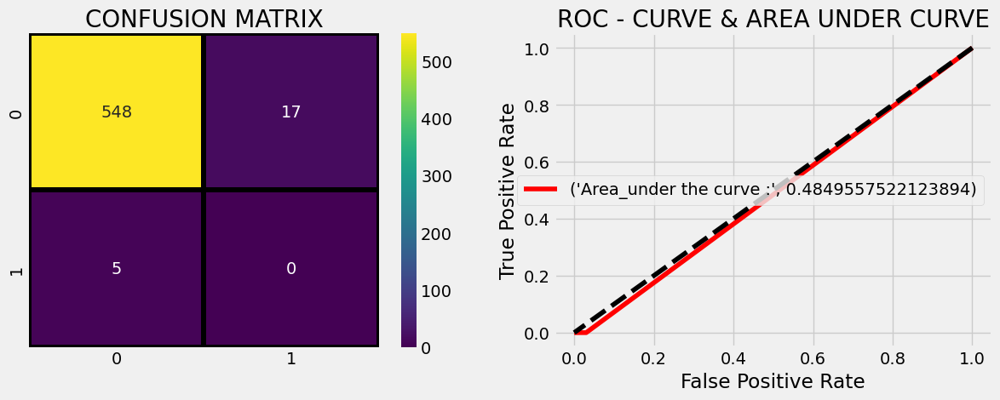

In [13]:
#Decision Tree
from sklearn.tree import DecisionTreeClassifier
ds_model = DecisionTreeClassifier(max_depth=5, random_state=13)
#max_depth=5: This parameter sets the maximum depth or maximum number of levels in the decision tree. 
#It limits the number of splits or branches that the tree can have.
#A smaller max_depth value can help prevent overfitting by limiting the complexity of the tree.
#it's a hyperparameter

ds_model.fit(x_train,y_train)

prediction=ds_model.predict(x_test)

print('Validation accuracy of Decision Tree is', accuracy_score(prediction,y_test))
print ("\nClassification report :\n",(classification_report(y_test,prediction)))

#Confusion matrix
plt.figure(figsize=(13,10))
plt.subplot(221)
sns.heatmap(confusion_matrix(y_test,prediction),annot=True,cmap="viridis",fmt = "d",linecolor="k",linewidths=3)
plt.title("CONFUSION MATRIX",fontsize=20)

#ROC curve and Area under the curve plotting
predicting_probabilites = ds_model.predict_proba(x_test)[:,1]
fpr,tpr,thresholds = roc_curve(y_test,predicting_probabilites)
plt.subplot(222)
plt.plot(fpr,tpr,label = ("Area_under the curve :",auc(fpr,tpr)),color = "r")
plt.plot([1,0],[1,0],linestyle = "dashed",color ="k")
plt.legend(loc = "best")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("ROC - CURVE & AREA UNDER CURVE",fontsize=20)

Since the dataset is highly imbalanced even if the model predicts the same class for all data points accuratly.

So let us first balance the classes and model it again.

### Balancing the class using SMOTE

**SMOTE** **(synthetic minority oversampling technique)** is one of the most commonly used oversampling methods to solve the imbalance problem. It aims to balance class distribution by randomly increasing minority class examples by replicating them. **SMOTE** synthesises new minority instances between existing minority instances.

After OverSampling, counts of label '1': 5049
After OverSampling, counts of label '0': 5049


<AxesSubplot:xlabel='index'>

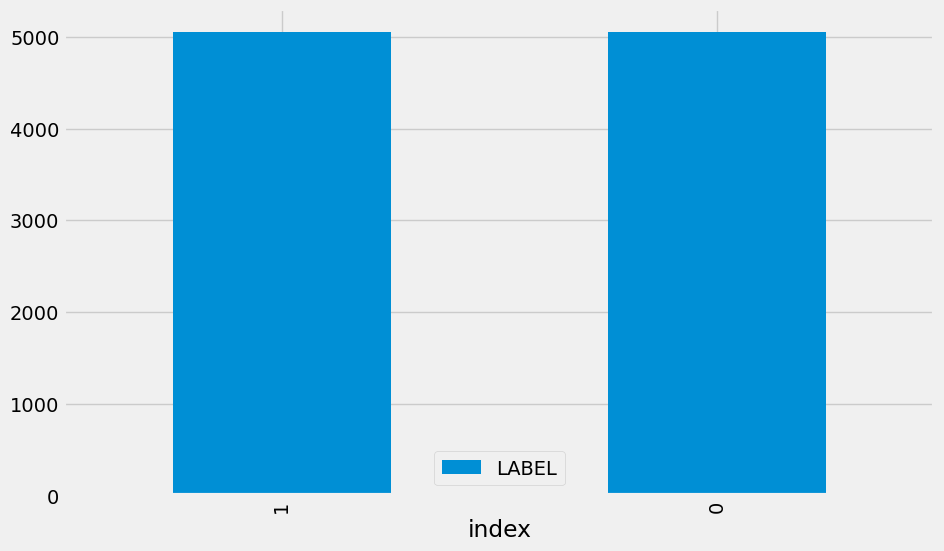

In [14]:
from imblearn.over_sampling import SMOTE
model = SMOTE()
ov_train_x,ov_train_y = model.fit_resample(train_data.drop('LABEL',axis=1), train_data['LABEL'])      
# .fit_sample() doesn't work if we import imblearn.over_sampling import SMOTE
print("After OverSampling, counts of label '1': {}".format(sum(ov_train_y==1)))
print("After OverSampling, counts of label '0': {}".format(sum(ov_train_y==0)))

ov_train_y = ov_train_y.astype('int')
#converting data type of a Series object to integer (int) to plot them.
#string values'0' and '1' that represent binary categories is being converted to integer for using in machine learning models

ov_train_y.value_counts().reset_index().plot(kind='bar', x='index', y='LABEL')


### Split the dataset

In [15]:
train_X, test_X, train_y, test_y = train_test_split(ov_train_x, ov_train_y, test_size=0.33, random_state=42)

Validation accuracy of Decision Tree is 0.9186918691869187

Classification report :
               precision    recall  f1-score   support

           0       0.99      0.85      0.91      1709
           1       0.86      0.99      0.92      1624

    accuracy                           0.92      3333
   macro avg       0.93      0.92      0.92      3333
weighted avg       0.93      0.92      0.92      3333



Text(0.5, 1.0, 'ROC - CURVE & AREA UNDER CURVE')

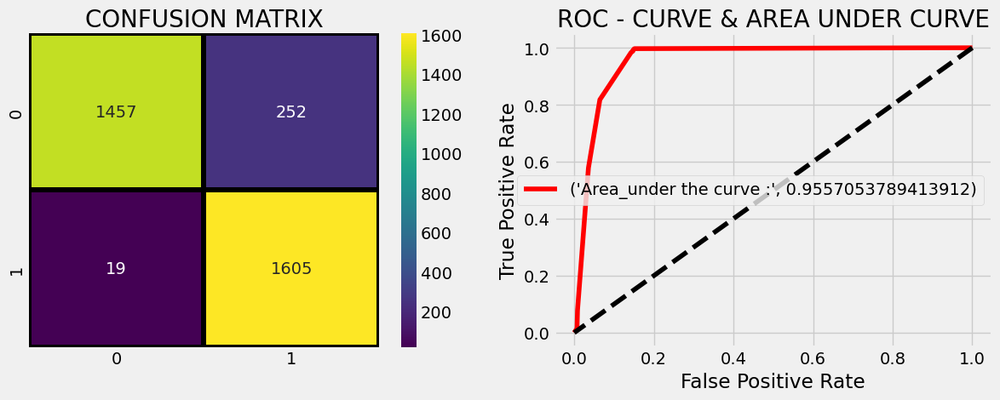

In [16]:
from sklearn.tree import DecisionTreeClassifier
ds_model = DecisionTreeClassifier(max_depth=5, random_state=13)

ds_model.fit(train_X,train_y)

prediction=ds_model.predict(test_X)

print('Validation accuracy of Decision Tree is', accuracy_score(prediction,test_y))
#in the latest version of the documentation of the function accuracy_score() the arguments are given in the above order.
#but previously in older documentation of accuracy_score() the arguments are given in the order as accuracy_score(test_y, prediction)

print ("\nClassification report :\n",(classification_report(test_y,prediction)))

#Confusion matrix
plt.figure(figsize=(13,10))
plt.subplot(221)
sns.heatmap(confusion_matrix(test_y,prediction),annot=True,cmap="viridis",fmt = "d",linecolor="k",linewidths=3)
plt.title("CONFUSION MATRIX",fontsize=20)

#ROC curve and Area under the curve plotting
predicting_probabilites = ds_model.predict_proba(test_X)[:,1]
fpr,tpr,thresholds = roc_curve(test_y,predicting_probabilites)
plt.subplot(222)
plt.plot(fpr,tpr,label = ("Area_under the curve :",auc(fpr,tpr)),color = "r")
plt.plot([1,0],[1,0],linestyle = "dashed",color ="k")
plt.legend(loc = "best")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("ROC - CURVE & AREA UNDER CURVE",fontsize=20)

We can see that on balancing the classes and modelling it again has improved the ROC Curve and the AUC has increased to 0.96 which makes it a good classifier.

Validation accuracy of KNN is 0.9828982898289829

Classification report :
               precision    recall  f1-score   support

           0       1.00      0.97      0.98      1709
           1       0.97      1.00      0.98      1624

    accuracy                           0.98      3333
   macro avg       0.98      0.98      0.98      3333
weighted avg       0.98      0.98      0.98      3333



Text(0.5, 1.0, 'ROC - CURVE & AREA UNDER CURVE')

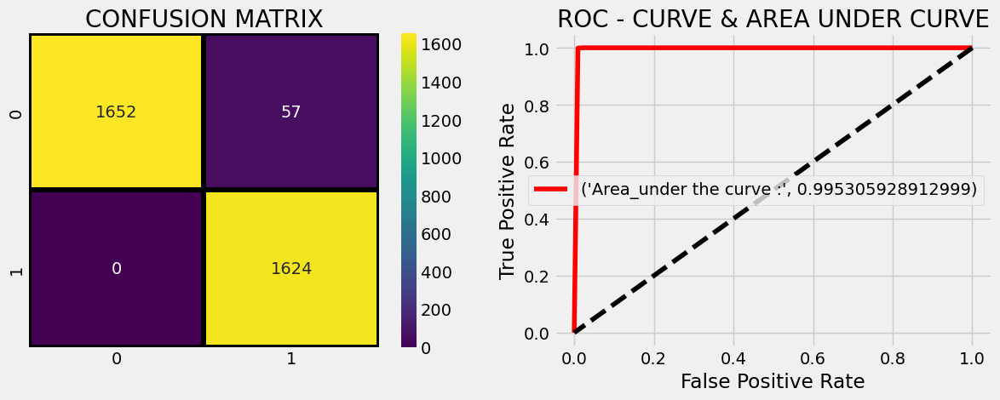

In [17]:
knn_model = KNeighborsClassifier()

knn_model.fit(train_X,train_y)

prediction=knn_model.predict(test_X)

print('Validation accuracy of KNN is', accuracy_score(prediction,test_y))
print ("\nClassification report :\n",(classification_report(test_y,prediction)))

#Confusion matrix
plt.figure(figsize=(13,10))
plt.subplot(221)
sns.heatmap(confusion_matrix(test_y,prediction),annot=True,cmap="viridis",fmt = "d",linecolor="k",linewidths=3)
plt.title("CONFUSION MATRIX",fontsize=20)

#ROC curve and Area under the curve plotting
predicting_probabilites = knn_model.predict_proba(test_X)[:,1]
fpr,tpr,thresholds = roc_curve(test_y,predicting_probabilites)
plt.subplot(222)
plt.plot(fpr,tpr,label = ("Area_under the curve :",auc(fpr,tpr)),color = "r")
plt.plot([1,0],[1,0],linestyle = "dashed",color ="k")
plt.legend(loc = "best")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("ROC - CURVE & AREA UNDER CURVE",fontsize=20)

Validation accuracy of Logistic Regression is 0.7395739573957396

Classification report :
               precision    recall  f1-score   support

           0       0.78      0.68      0.73      1709
           1       0.70      0.80      0.75      1624

    accuracy                           0.74      3333
   macro avg       0.74      0.74      0.74      3333
weighted avg       0.74      0.74      0.74      3333



Text(0.5, 1.0, 'ROC - CURVE & AREA UNDER CURVE')

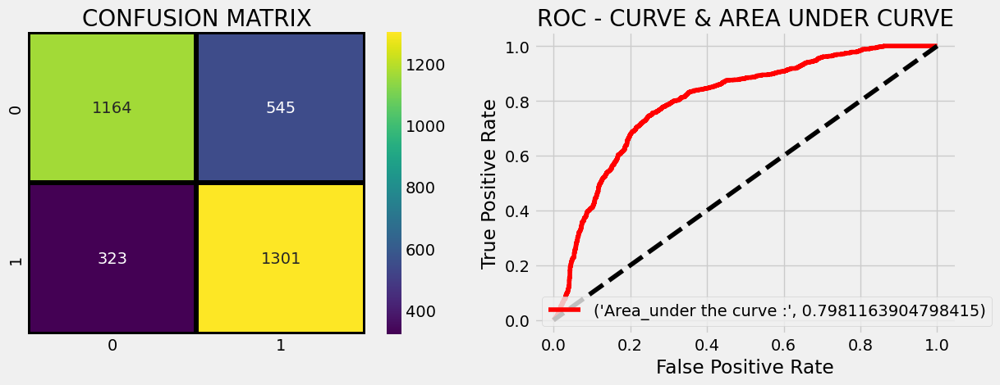

In [18]:
lr_model = LogisticRegression(class_weight={0:100, 1:1})
#class weight indicates here that the model should give 100 times more importance to correctly classifying samples of class 0 than class 1.

lr_model.fit(train_X,train_y)

prediction=lr_model.predict(test_X)

print('Validation accuracy of Logistic Regression is', accuracy_score(prediction,test_y))
print ("\nClassification report :\n",(classification_report(test_y,prediction)))

#Confusion matrix
plt.figure(figsize=(13,10))
plt.subplot(221)
sns.heatmap(confusion_matrix(test_y,prediction),annot=True,cmap="viridis",fmt = "d",linecolor="k",linewidths=3)
plt.title("CONFUSION MATRIX",fontsize=20)

#ROC curve and Area under the curve plotting
predicting_probabilites = lr_model.predict_proba(test_X)[:,1]
fpr,tpr,thresholds = roc_curve(test_y,predicting_probabilites)
plt.subplot(222)
plt.plot(fpr,tpr,label = ("Area_under the curve :",auc(fpr,tpr)),color = "r")
plt.plot([1,0],[1,0],linestyle = "dashed",color ="k")
plt.legend(loc = "best")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("ROC - CURVE & AREA UNDER CURVE",fontsize=20)

As we can observe after applying SMOTE to balance the classes, our ML models are performing really good.

In the above cases we have predicted on test datas which are obtained from over-sampling by SMOTE. Below here I have made prediction on the original test dataset which we had before oversampling. But the train dataset I used here is the one obtained after oversampling. Obviously, The result obtained is not good.

Validation accuracy of KNN is 0.9912280701754386

Classification report :
               precision    recall  f1-score   support

           0       0.99      1.00      1.00       565
           1       0.00      0.00      0.00         5

    accuracy                           0.99       570
   macro avg       0.50      0.50      0.50       570
weighted avg       0.98      0.99      0.99       570



Text(0.5, 1.0, 'ROC - CURVE & AREA UNDER CURVE')

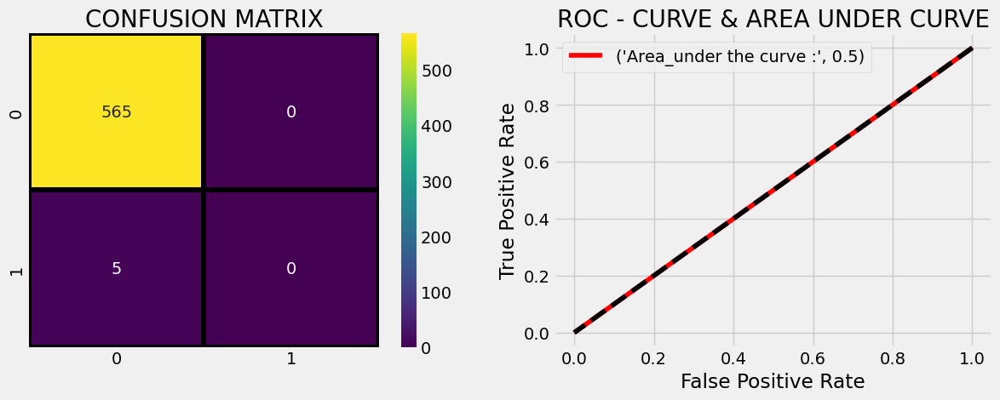

In [19]:
knn_model = KNeighborsClassifier()

knn_model.fit(train_X,train_y)

prediction=knn_model.predict(x_test)

print('Validation accuracy of KNN is', accuracy_score(prediction,y_test))
print ("\nClassification report :\n",(classification_report(y_test,prediction)))

#Confusion matrix
plt.figure(figsize=(13,10))
plt.subplot(221)
sns.heatmap(confusion_matrix(y_test,prediction),annot=True,cmap="viridis",fmt = "d",linecolor="k",linewidths=3)
plt.title("CONFUSION MATRIX",fontsize=20)

#ROC curve and Area under the curve plotting
predicting_probabilites = knn_model.predict_proba(x_test)[:,1]
fpr,tpr,thresholds = roc_curve(y_test,predicting_probabilites)
plt.subplot(222)
plt.plot(fpr,tpr,label = ("Area_under the curve :",auc(fpr,tpr)),color = "r")
plt.plot([1,0],[1,0],linestyle = "dashed",color ="k")
plt.legend(loc = "best")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("ROC - CURVE & AREA UNDER CURVE",fontsize=20)

The accuracy score is a measure of the percentage of correct predictions made by a classification model. It is calculated as the ratio of the number of correct predictions to the total number of predictions. While, the area under the ROC curve is a measure of the ability of a classification model to distinguish between positive and negative classes. 

In other words, the accuracy score tells you how often the model is correct, while the AUROC tells you how well the model is able to distinguish between the positive and negative classes. The AUROC is generally considered to be a more robust measure of classification performance, especially when dealing with imbalanced datasets.